In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

from matplotlib import rcParams

import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('default')  

#-- 
#https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

import warnings
warnings.filterwarnings('ignore')

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [2]:
sc.settings.set_figure_params(dpi=80)

In [7]:
#----- After scrublet, before filtration  .
adata_AS=sc.read('./24samples/H5AD/iVacc_AS_110319.h5ad')
adata_AS


AnnData object with n_obs × n_vars = 141591 × 33538 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1'
    var: 'gene_ids', 'feature_types'

In [8]:
adata_AS

AnnData object with n_obs × n_vars = 141591 × 33538 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1'
    var: 'gene_ids', 'feature_types'

In [9]:
adata_AS.obs['Groups'].value_counts().filter(like='LS', axis=0)

LS    36995
Name: Groups, dtype: int64

In [18]:
adata_AS.obs.to_csv('./meta/Meta_iVacc_AS_110319.csv')

In [10]:
#-- cells babies before-after ONLY (18 samples ) 

cells_of_interest =adata_AS.obs.loc[~adata_AS.obs["Groups"].isin(["LS"]), :].index

adata_Scrublet = adata_AS[cells_of_interest, :]
adata_Scrublet

View of AnnData object with n_obs × n_vars = 104596 × 33538 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1'
    var: 'gene_ids', 'feature_types'

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


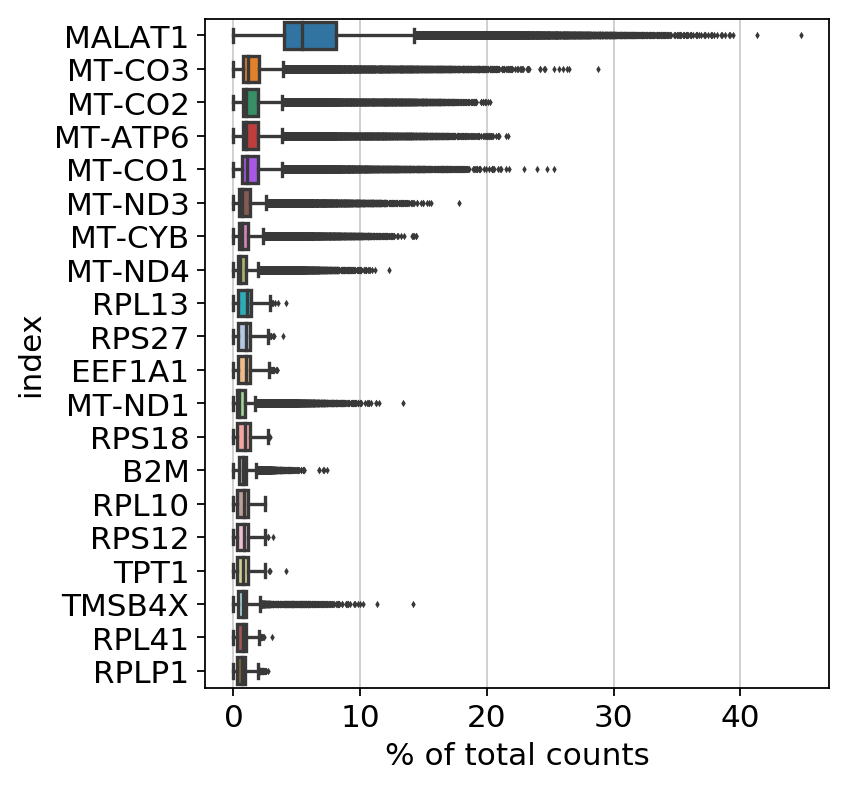

In [11]:
adata_Scrublet.var_names_make_unique()
sc.pl.highest_expr_genes(adata_Scrublet, n_top=20)

In [12]:
sc.pp.filter_cells(adata_Scrublet, min_genes=400) #***
sc.pp.filter_genes(adata_Scrublet, min_cells=3)

filtered out 9394 cells that haveless than 400 genes expressed


Trying to set attribute `.obs` of view, making a copy.


filtered out 10702 genes that are detectedin less than 3 cells


In [13]:
adata_Scrublet.obs['IDs'].head()

index
AAACCCAAGAACTGAT-1    JB19050
AAACCCAAGTGTAGAT-1    JB19050
AAACCCACAACAAAGT-1    JB19050
AAACCCAGTAGACAGC-1    JB19050
AAACCCAGTATTAAGG-1    JB19050
Name: IDs, dtype: category
Categories (18, object): [JB19050, JB19051, JB19052, JB19053, ..., JB19068, JB19069, JB19070, JB19071]

In [14]:
#----- After scrublet, after filtration  
adata_Scrublet.obs['IDs'].value_counts()


JB19055    10084
JB19051     9287
JB19053     9033
JB19052     7149
JB19054     6163
JB19050     5978
JB19071     5254
JB19062     5150
JB19069     4699
JB19060     4446
JB19070     4444
JB19063     4283
JB19058     4152
JB19068     3987
JB19066     3602
JB19061     3458
JB19059     3059
JB19067      974
Name: IDs, dtype: int64

In [15]:
adata_Scrublet.obs.to_csv('./meta/Meta_iVacc_AF_110319.csv')

In [16]:
adata_Scrublet

AnnData object with n_obs × n_vars = 95202 × 22836 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [17]:
mito_genes = adata_Scrublet.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata_Scrublet.obs['percent_mito'] = np.sum(
    adata_Scrublet[:, mito_genes].X, axis=1).A1 / np.sum(adata_Scrublet.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata_Scrublet.obs['n_counts'] = adata_Scrublet.X.sum(axis=1).A1


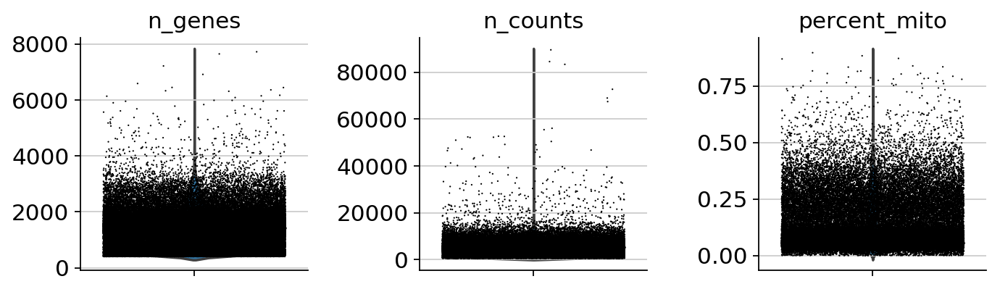

In [19]:
rcParams['figure.figsize'] = (5,5)
sc.pl.violin(adata_Scrublet, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

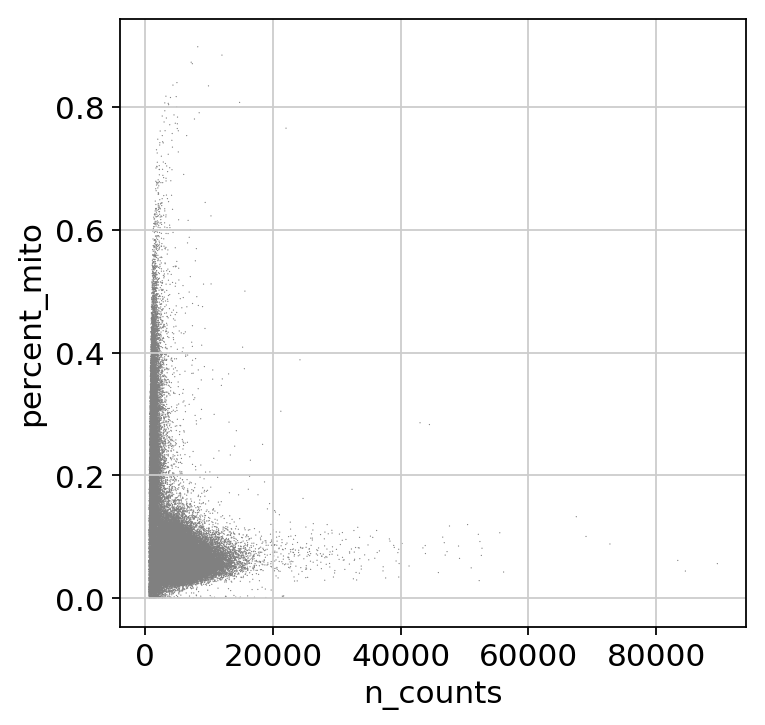

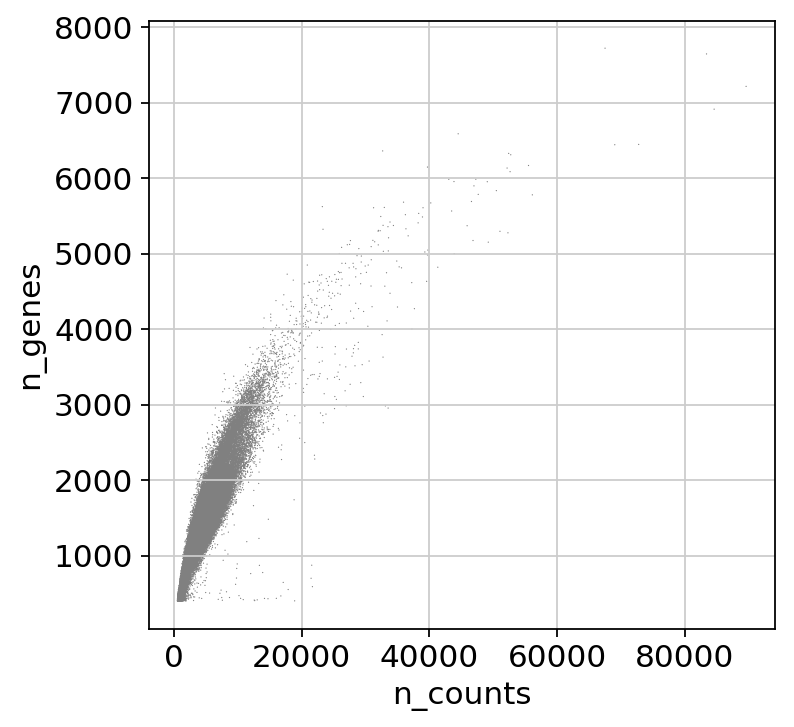

In [20]:
#pct_counts_mito:percent_mito
#total_features_by_counts:n_genes
#total_counts: n_counts
sc.pl.scatter(adata_Scrublet, x='n_counts', y='percent_mito')
sc.pl.scatter(adata_Scrublet, x='n_counts', y='n_genes')

In [21]:
adata_Scrublet

AnnData object with n_obs × n_vars = 95202 × 22836 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [22]:
#-- filtering: number of genes and % mito
adata_Scrublet = adata_Scrublet[adata_Scrublet.obs['n_genes'] < 2500, :]
adata_Scrublet = adata_Scrublet[adata_Scrublet.obs['percent_mito'] < 0.25, :] #-- 20% mito 
adata_Scrublet

View of AnnData object with n_obs × n_vars = 82153 × 22836 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [23]:
adata_Scrublet

View of AnnData object with n_obs × n_vars = 82153 × 22836 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [24]:
adata_Scrublet.obs['IDs'].value_counts()


JB19055    8766
JB19051    8126
JB19053    7180
JB19052    6540
JB19050    4805
JB19062    4698
JB19054    4660
JB19071    4494
JB19069    3965
JB19060    3842
JB19058    3840
JB19063    3813
JB19068    3742
JB19070    3678
JB19066    3455
JB19061    3006
JB19059    2624
JB19067     919
Name: IDs, dtype: int64

normalizing by total count per cell


Trying to set attribute `.obs` of view, making a copy.


    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


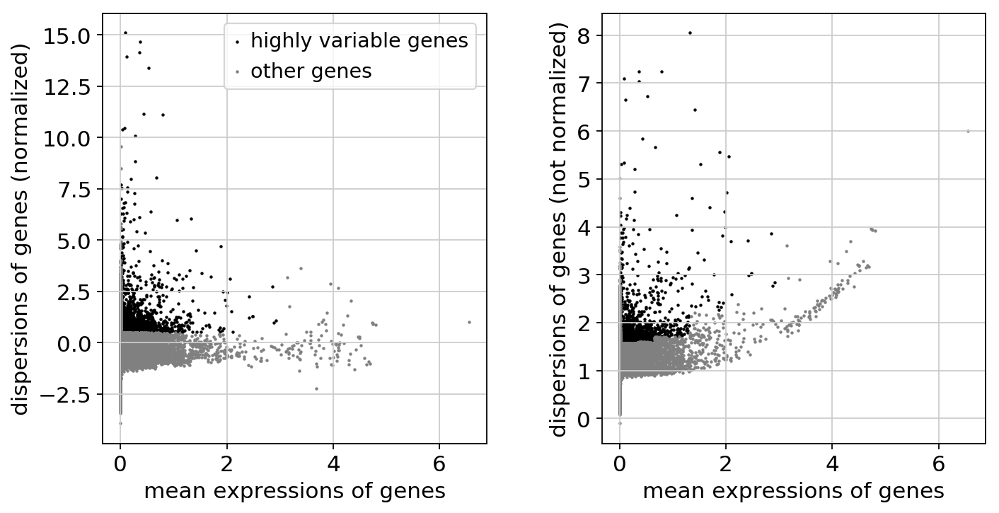

In [25]:
#--- Per-cell normalize (library-size correct) the data matrix X, so that counts become comparable among cells.



#--- Per-cell normalize (library-size correct) the data matrix X, so that counts become comparable among cells.
sc.pp.normalize_per_cell(adata_Scrublet, counts_per_cell_after=1e4)

#--- Logarithmize the data
sc.pp.log1p(adata_Scrublet)

adata_Scrublet.raw = adata_Scrublet

#-- Identify highly-variable genes (HVG)
sc.pp.highly_variable_genes(adata_Scrublet, min_mean=0.0125, max_mean=3, min_disp=0.5)

#-- plot HVG
sc.pl.highly_variable_genes(adata_Scrublet)


#-- Actually do the filtering
adata_Scrublet = adata_Scrublet[:, adata_Scrublet.var['highly_variable']]


In [26]:
#--- Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance

#sc.pp.regress_out(adata_Scrublet, ['n_counts', 'percent_mito'])


/home/nehard/anaconda3/envs/loompy/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:22)


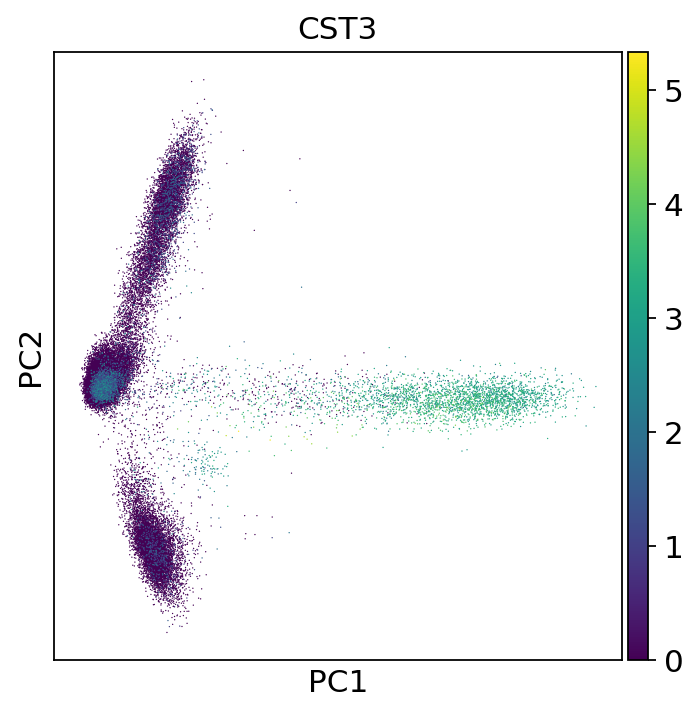

In [27]:
#-- Scale each gene to unit variance. Clip values exceeding standard deviation 10.

sc.pp.scale(adata_Scrublet, max_value=10)

#-- Principal component analysis

sc.tl.pca(adata_Scrublet, svd_solver='arpack')
sc.pl.pca(adata_Scrublet, color='CST3')


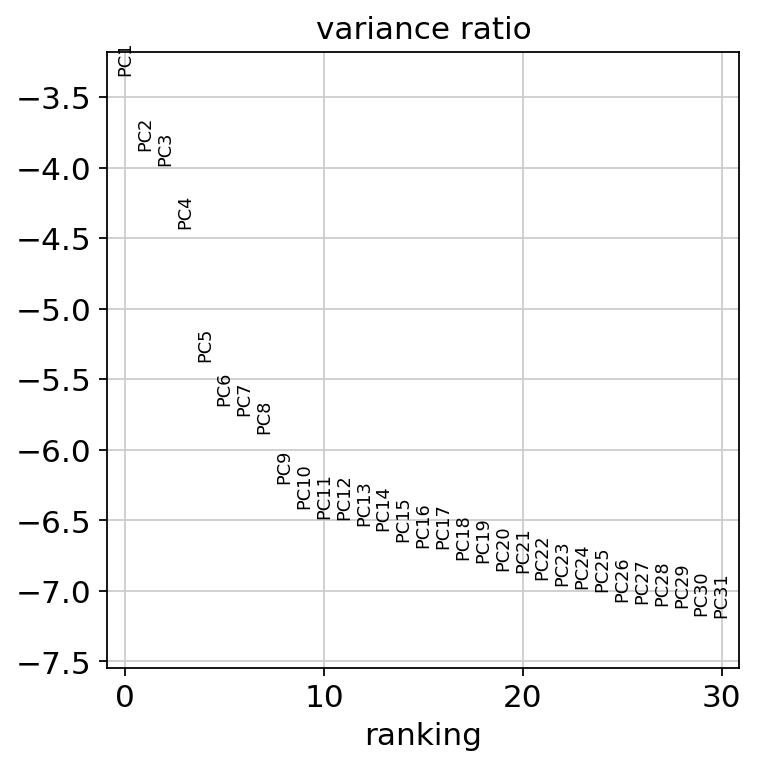

In [28]:
sc.pl.pca_variance_ratio(adata_Scrublet, log=True)


In [29]:
#-- save object after mito + number genes after filtration
adata_Scrublet.write('./H5AD/iVacc_AM_110319.h5ad')

#-- save meta after mito + number genes after filtration
adata_Scrublet.obs.to_csv('./meta/Meta_iVacc_AM_1110319.csv')

adata_Scrublet

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [30]:
#------  Computing the neighborhood graph
sc.pp.neighbors(adata_Scrublet, n_neighbors=10, n_pcs=40)
sc.logging.print_memory_usage()


computing neighbors
    using 'X_pca' with n_pcs = 40


/home/nehard/anaconda3/envs/loompy/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../home/nehard/anaconda3/envs/loompy/lib/python3.6/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/nehard/anaconda3/envs/loompy/lib/python3.6/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../..

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:24)
Memory usage: current 7.70 GB, difference +7.70 GB


In [31]:
#--- without regressing 

#sc.tl.pca(adata)
#sc.pp.neighbors(adata)
#sc.tl.louvain(adata)
#sc.tl.umap(adata_Scrublet, n_components=3)



In [32]:
#------  Embedding the neighborhood graph : Run UMAP

sc.tl.umap(adata_Scrublet, n_components=3)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:35)


In [33]:
#-- Embedding the neighborhood graph: Run Umap on paga 
# In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:
#tl.paga(adata)
#pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
#tl.umap(adata, init_pos='paga')

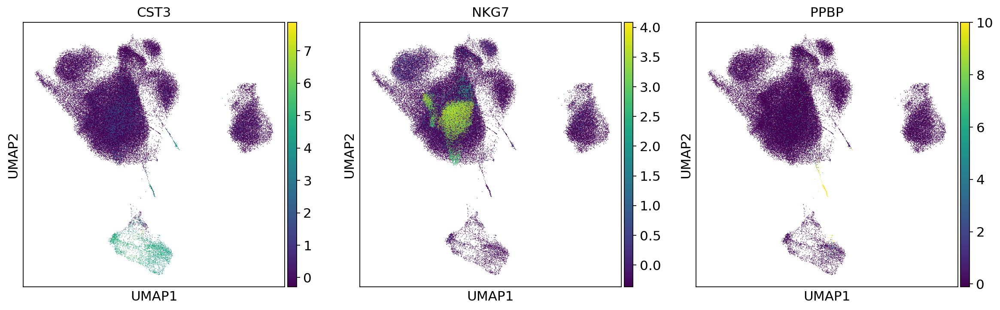

In [34]:
#-- plot the scaled and corrected gene expression
from matplotlib import rcParams
rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata_Scrublet, color=['CST3', 'NKG7', 'PPBP'], use_raw=False)

In [35]:
#- Clustering the single-cell graph
sc.tl.louvain(adata_Scrublet, resolution=1.2) #resolution=0.3

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:34)


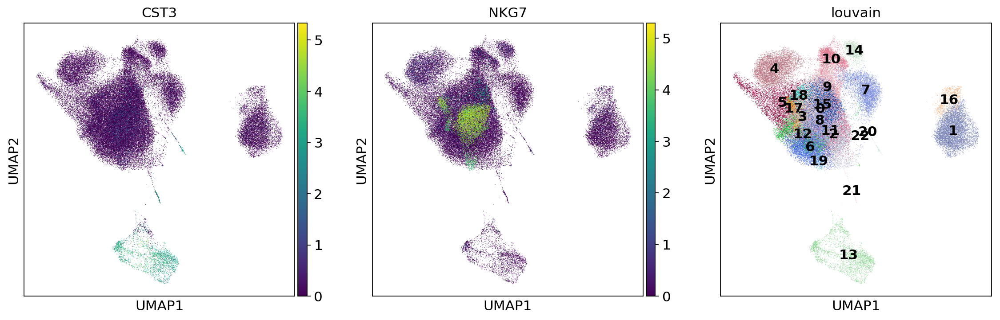

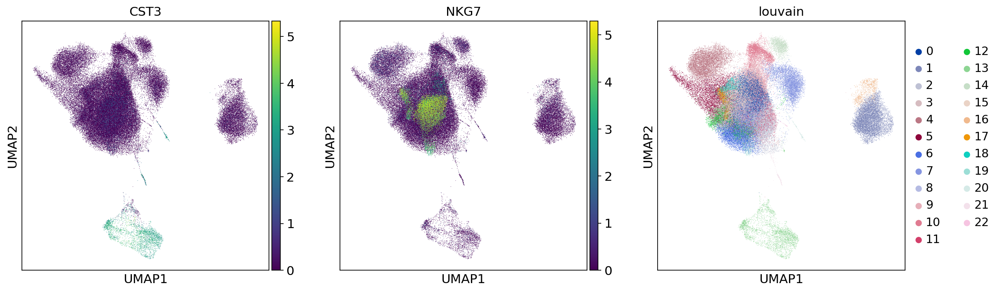

In [36]:
rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata_Scrublet, color=['CST3', 'NKG7','louvain'], edgecolor='none', size=1, show=True, linewidths=10,legend_loc='on data')
sc.pl.umap(adata_Scrublet, color=['CST3', 'NKG7','louvain'], edgecolor='none', size=1, show=True, linewidths=10)

In [63]:
adata_Scrublet

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Batches_colors', 'Groups_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

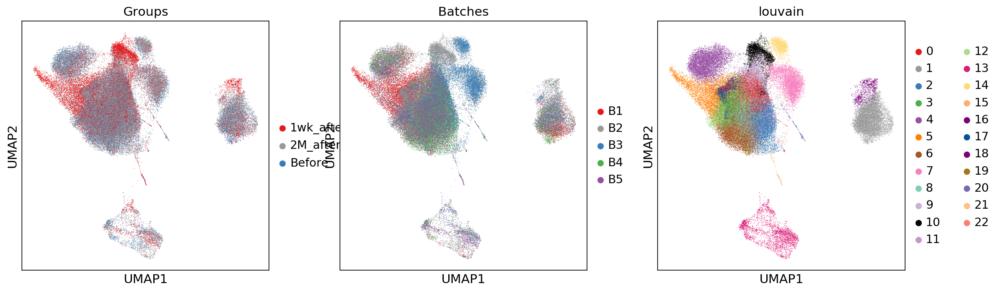

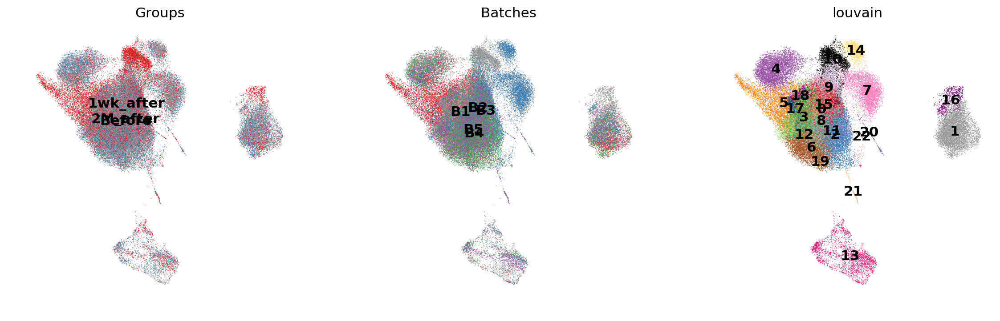

In [38]:
#----------------- BEFORE CORRECTION

col_ids =['#e41a1c','#999999','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628','#f781bf','#7fcdbb','#cab2d6',"#060404","#c994c7","#addd8e","#dd1c77","#fed976","#fdae6b","#7a0177",
          "#08519c","#7a0177","#a6761d","#756bb1","#fdc086","#fb8072","#8dd3c7","#ece2f0","#a6bddb","#1c9099","#ae017e"]

rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata_Scrublet, color=['Groups','Batches','louvain'],palette=col_ids)
sc.pl.umap(adata_Scrublet, color=['Groups', 'Batches','louvain'], legend_loc='on data',palette=col_ids,frameon=False)


In [39]:
adata_Scrublet.write('./H5AD/iVacc_BC_110319.h5ad')
adata_Scrublet

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'louvain', 'louvain_colors', 'Groups_colors', 'Batches_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [40]:
#--- save embeddings BEFORE CORRECTION

#--- Umap embbedings 
Emb =adata_Scrublet.obsm.to_df()[['X_umap1', 'X_umap2', 'X_umap3']]
Emb.index =adata_Scrublet.obs.index

#-- Meta Data 
meta =adata_Scrublet.obs
Mat = meta.join(Emb)

Mat.to_csv('./meta/Meta_iVacc_BC_101819.csv')


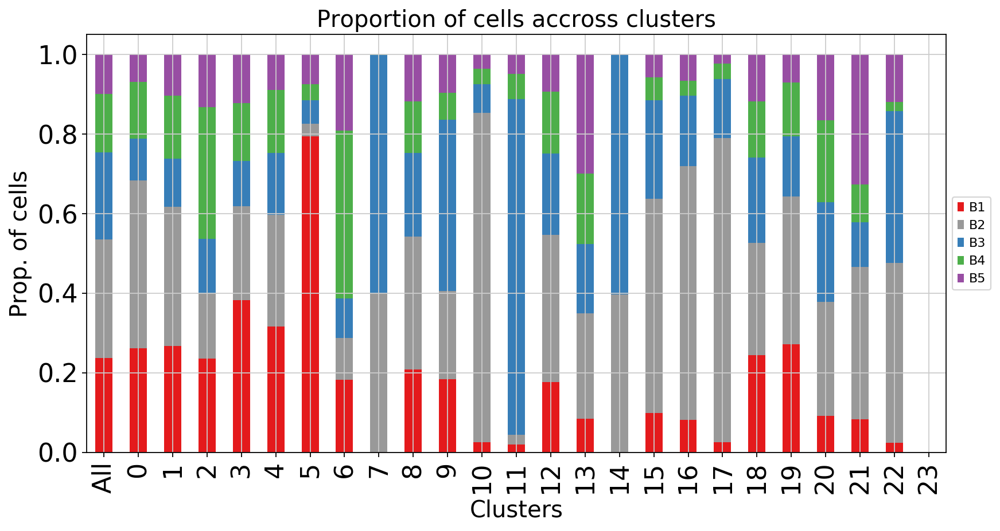

In [44]:
#-- proportion table
Groups_tab = pd.crosstab(index=adata_Scrublet.obs['louvain'],  # Make a crosstab
                        columns=adata_Scrublet.obs['Batches'], margins=True)               # Name the count column


#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21','22'])
#Groups_tab = Groups_tab[['SLE','HD','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Proportion of cells accross clusters", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()


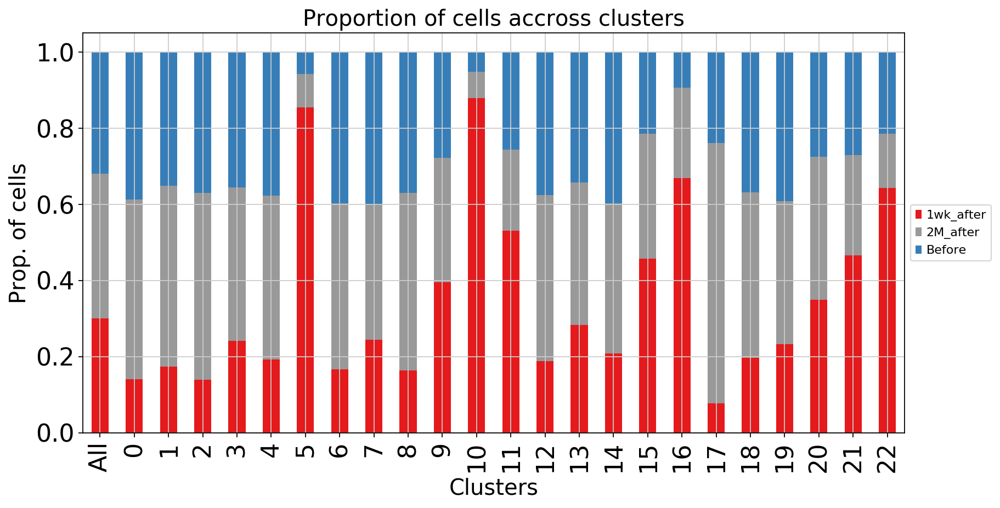

In [45]:
#-- proportion table
Groups_tab = pd.crosstab(index=adata_Scrublet.obs['louvain'],  # Make a crosstab
                        columns=adata_Scrublet.obs['Groups'], margins=True)               # Name the count column


#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21','22'])
#Groups_tab = Groups_tab[['SLE','HD','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Proportion of cells accross clusters", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()


In [56]:
adata_Scrublet= sc.read('./H5AD/iVacc_BC_110319.h5ad')
adata_Scrublet

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Batches_colors', 'Groups_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [64]:
#--------------------- 10 BATCHES : BBKNN batch correction
import bbknn
#--- bbkkn batch correction --> 10X batches 
corrected = bbknn.bbknn(adata_Scrublet, 
                        copy=True, 
                        batch_key="IDs", 
                        metric="angular", 
                        approx=True,
                        neighbors_within_batch=5, 
                        n_pcs=20, 
                        trim=50)


computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:01:01)


In [65]:
#--- UMAP on corrected data 
sc.tl.umap(corrected, 
           min_dist=0.3,
           n_components=3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:05)


In [66]:
#--- louvain on corrected data
sc.tl.louvain(corrected, 
              resolution=1.2) #default , resolution = 1


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:01:20)


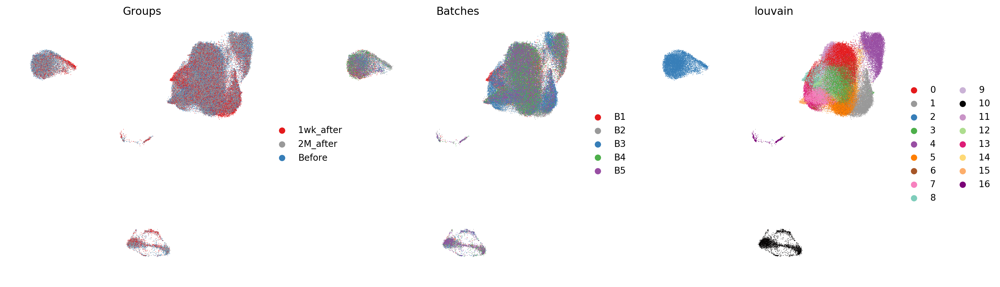

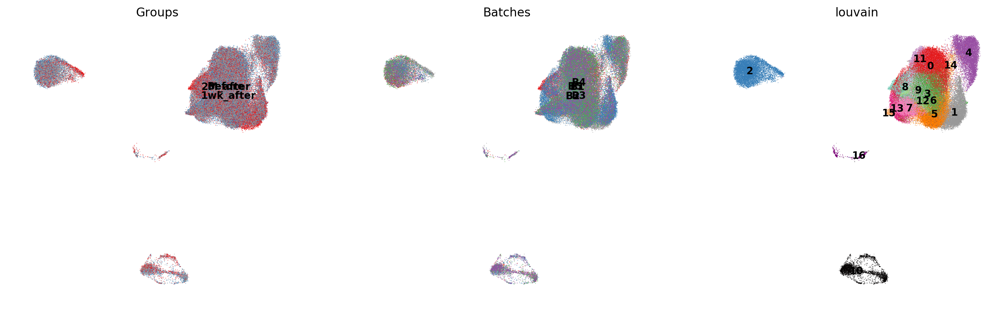

In [67]:
#----------------- AFETR 10X batches  CORRECTION

rcParams['figure.figsize'] = (5,5)

sc.pl.umap(corrected, color=['Groups','Batches','louvain']Subjectsameon=False)
sc.pl.umap(corrected, color=['Groups', 'Batches','louvain'],
           frameon=False,legend_loc='on data',legend_fontsize=10)



In [68]:
corrected.uns['Groups_colors']

['#e41a1c', '#999999', '#377eb8']

In [69]:

col_ids =['tomato','paleturquoise','cornflowerblue','mediumseagreen','mediumpurple','goldenrod','lightgreen','palevioletred','lightsalmon','thistle', #0-9
          "brown","plum","lightskyblue","yellowgreen","mediumorchid","mediumturquoise","peru","darkviolet","mediumaquamarine","lightslategrey","dodgerblue"]
col_groups =['mediumaquamarine','lightsalmon','lightskyblue','tomato']


corrected.uns['Batches_colors']= col_ids
corrected.uns['louvain_colors']= col_ids
corrected.uns['clusters_colors']= col_ids
corrected.uns['Groups_colors']= col_groups



In [52]:
#--- save embeddings AFTER CORRECTION

#--- Umap embbedings 
Emb = corrected.obsm.to_df()[['X_umap1', 'X_umap2', 'X_umap3']]
Emb.index = corrected.obs.index

#-- Meta Data 
meta = corrected.obs
Mat = meta.join(Emb)
Mat.to_csv('./meta/Meta_iVacc_AC_110419.csv')

corrected.write('./H5AD/iVacc_AC_1110419.h5ad')

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'louvain', 'louvain_colors', 'Groups_colors', 'Batches_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

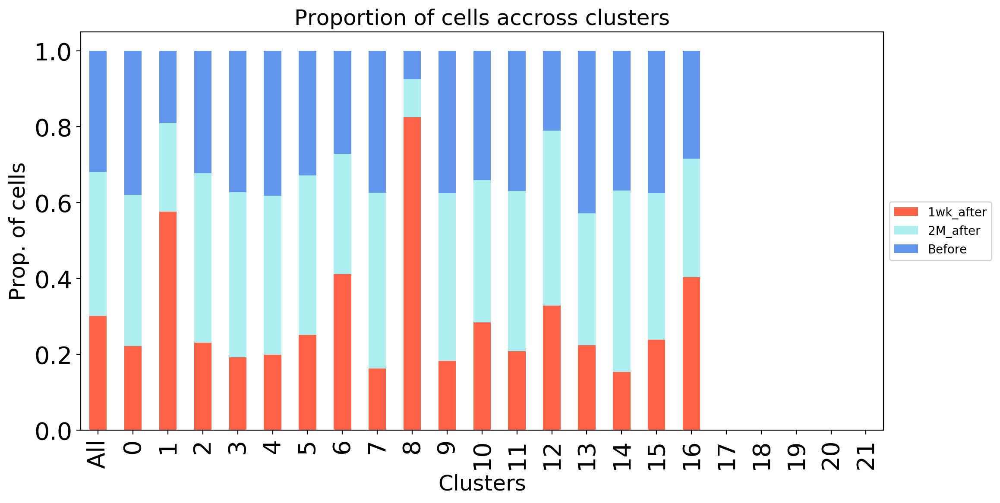

In [70]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['louvain'],  # Make a crosstab
                        columns=corrected.obs['Groups'], margins=True)               # Name the count column


#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21'])
#Groups_tab = Groups_tab[['SLE','HD','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Proportion of cells accross clusters", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()



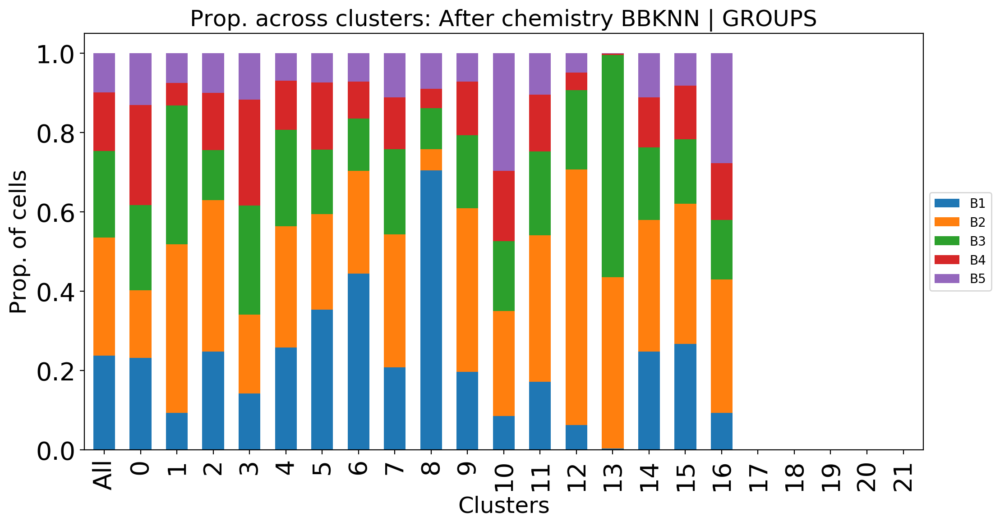

In [71]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['louvain'],  # Make a crosstab
                        columns=corrected.obs['Batches'], margins=True)               # Name the count column


#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21'])
#Groups_tab = Groups_tab[['HI','HC','HY','HO','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.6, 
            fontsize=20)

plt.title("Prop. across clusters: After chemistry BBKNN | GROUPS", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()



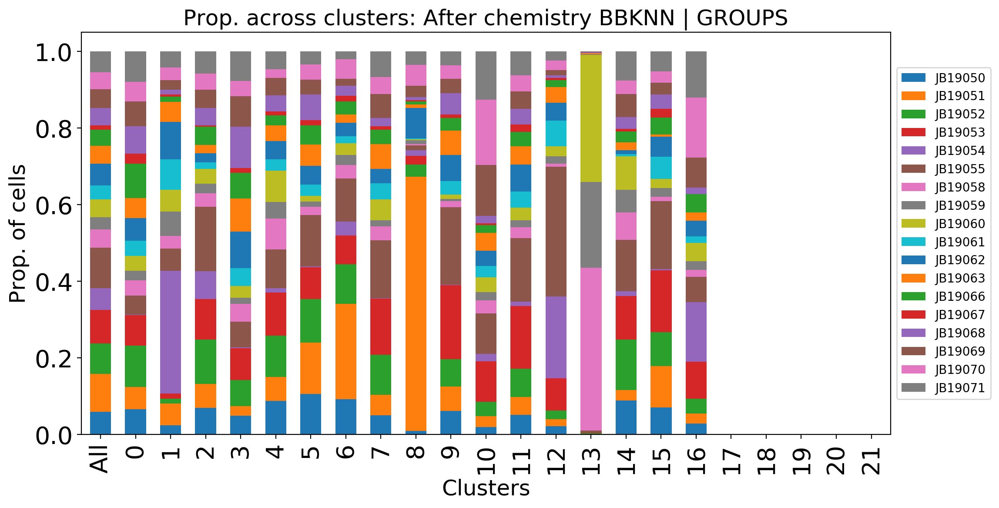

In [72]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['louvain'],  # Make a crosstab
                        columns=corrected.obs['IDs'], margins=True)               # Name the count column


#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21'])
#Groups_tab = Groups_tab[['HI','HC','HY','HO','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.6, 
            fontsize=20)

plt.title("Prop. across clusters: After chemistry BBKNN | GROUPS", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()



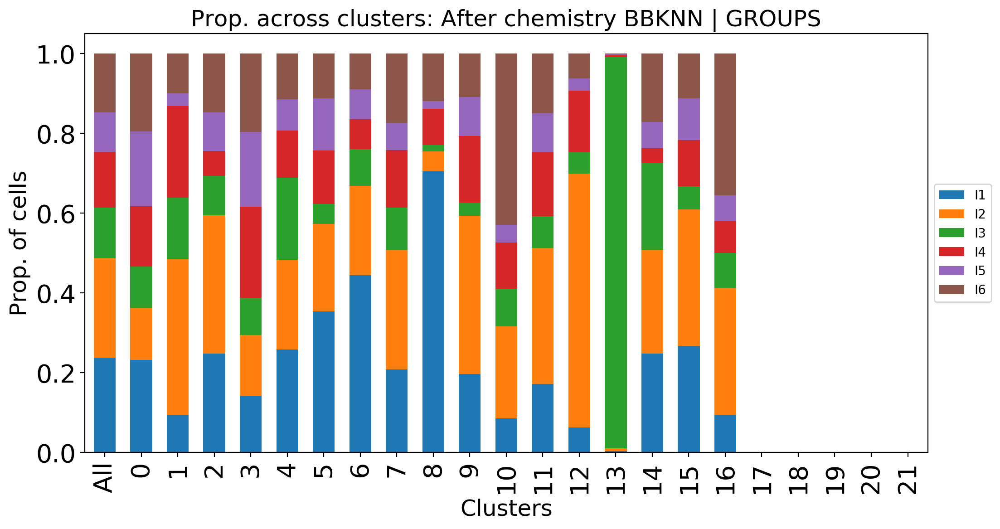

In [73]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['louvain'],  # Make a crosstab
                        columns=corrected.obs['Subjects'], margins=True)               # Name the count column


#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21'])
#Groups_tab = Groups_tab[['HI','HC','HY','HO','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.6, 
            fontsize=20)

plt.title("Prop. across clusters: After chemistry BBKNN | GROUPS", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()



In [85]:
#adata_SC = sc.read('./H5AD/LifeSpan_AS_BF_BC_100819.h5ad')
#adata_SC.obs.to_csv('./Meta/Meta_LifeSpan_AS_BF_BC_100819')

In [86]:
corrected

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'louvain', 'louvain_colors', 'Groups_colors', 'Batches_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`
categories: 0, 1, 2, etc.
var_group_labels: Mono, DCs, T cells, etc.


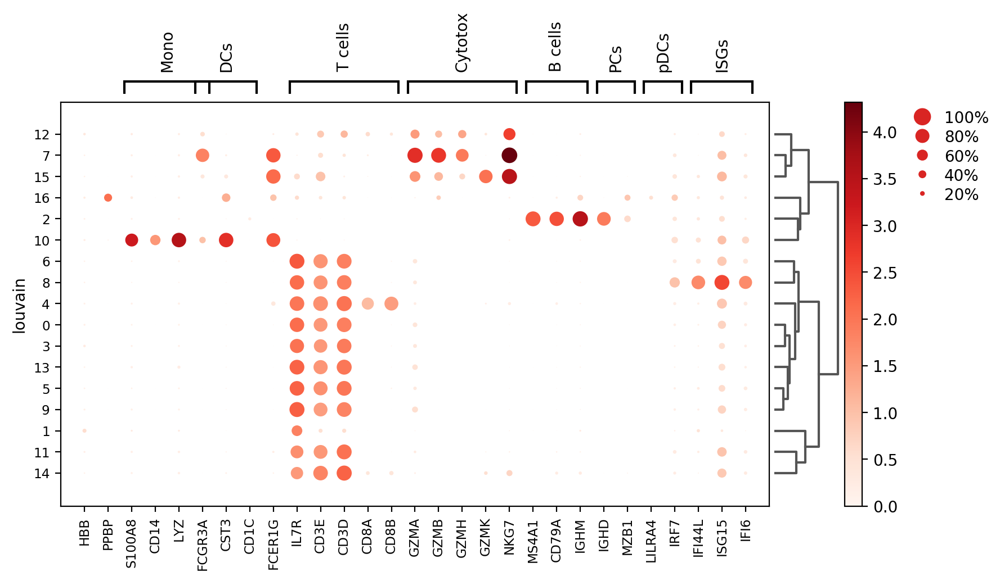

In [74]:

sc.settings.set_figure_params(dpi=300)  # set sufficiently high resolution for saving

Genes =["HBB", "PPBP","S100A8","CD14","LYZ","FCGR3A","CST3",'CD1C',"FCER1G","IL7R","CD3E","CD3D","CD8A","CD8B", 
        "GZMA","GZMB","GZMH","GZMK", "NKG7", "MS4A1", "CD79A",'IGHM',"IGHD","MZB1",'LILRA4',"IRF7",
        'IFI44L','ISG15','IFI6']
matplotlib.style.use('default') 


ax = sc.pl.dotplot(corrected, 
                   Genes, 
                   'louvain', 
                   dendrogram=True,  
                   var_group_positions=[(2,5), (5,7),(9,13),(14,18),(19,21),(22,23),(24,25),(26,28)],
                   var_group_labels=['Mono', 'DCs','T cells','Cytotox','B cells','PCs','pDCs','ISGs'], 
                   figsize=(10,5)) #, save='_Fig1c_LifeSpan') #, save='_Fig1c.pdf'


In [63]:
#corrected = sc.read('./H5AD/Vacc_AC_101819.h5ad')
#corrected

AnnData object with n_obs × n_vars = 55939 × 2410 
    obs: 'Samples', 'Names', 'Batches', 'Groups', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Batches_colors', 'Groups_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [6]:
corrected.obs['clusters']=corrected.obs['louvain']

In [7]:
new_cluster_names = ["C0_CD4_T","C1_CD14_mono","C2_CD4_T","C3_CD8_T",
                "C4_IgD_B","C5_CD4_T","C6_NK","C7_CD4_T",
                "C8_GzH_acCD8_T","C9_CD4_T","C10_CD4_T","C11_CD4_T",
                "C12_CD16_mono","C13_B","C14_GzK_acCD8_T",  
                    "C15_NK", "C16_Mgk","C17_DCs","C18_pDCs","C19_ISGhi_CD4_T",'C20_PCs']

corrected.rename_categories('clusters', new_cluster_names)
corrected

AnnData object with n_obs × n_vars = 426594 × 1094 
    obs: 'Gender', 'Samples', 'Names', 'Age', 'Batches', 'Groups', 'Sample_ids', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Batches_colors', 'Groups_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [9]:
corrected.write('./H5AD/LifeSpan_AC_100819.h5ad')


In [10]:
corrected.obs.head()

,Gender,Samples,Names,Age,Batches,Groups,Sample_ids,IDs,doublet_score,predicted_doublets_1,n_genes,percent_mito,n_counts,louvain,clusters
index,,,,,,,,,,,,,,,
AAACCTGAGACTTTCG-1,M,1,HI_1,14M,B1,HI,HC_NCH_111,JB18001,0.095873,singlet,1040,0.018468,4440.0,9,C9_CD4_T
AAACCTGAGGACCACA-1,M,1,HI_1,14M,B1,HI,HC_NCH_111,JB18001,0.099617,singlet,888,0.013270,4446.0,2,C2_CD4_T
AAACCTGCACACGCTG-1,M,1,HI_1,14M,B1,HI,HC_NCH_111,JB18001,0.161896,singlet,488,0.051060,1273.0,0,C0_CD4_T
AAACCTGGTTCGGCAC-1,M,1,HI_1,14M,B1,HI,HC_NCH_111,JB18001,0.040141,singlet,1141,0.050799,2441.0,8,C8_GzH_acCD8_T
AAACCTGTCGCTTAGA-1,M,1,HI_1,14M,B1,HI,HC_NCH_111,JB18001,0.085812,singlet,1000,0.013083,4586.0,2,C2_CD4_T


In [3]:
adata_BC=sc.read('./H5AD/iVacc_BC_110319.h5ad')
adata_BC

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Batches_colors', 'Groups_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [4]:
#-- set R HOME 
import os

os.environ['R_HOME'] = '/home/nehard/anaconda3/envs/loompy/lib/R'

In [5]:
#---HARMONY BATCH CORRECTION

%load_ext rpy2.ipython
import rpy2
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython





The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [6]:
%%R #-o test
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(tidyr))


In [40]:
pca = adata_BC.obsm['X_pca']
batch = adata_BC.obs['IDs']

In [41]:
%%R -i pca -i batch -o hem
suppressPackageStartupMessages(library(harmony))
suppressPackageStartupMessages(library(magrittr))


t1 = Sys.time()
hem <- HarmonyMatrix(pca, batch, theta=4, do_pca=F)
t2 = Sys.time()

hem = data.frame(hem)

t2-t1

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write t

[1] 5.617712


In [55]:
hem.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X41,X42,X43,X44,X45,X46,X47,X48,X49,X50
1,-2.694758,0.222931,-2.349244,1.146205,-0.397759,-0.351700,-0.041618,-0.185609,-1.970227,-1.927869,...,1.056635,1.473653,-0.756660,-0.572083,-0.909920,0.020571,-0.630534,0.256606,-0.233546,-1.569802
2,-2.352660,-0.329756,-2.971658,-1.490540,2.281742,0.248159,-1.741866,1.222852,0.040728,-0.084447,...,-0.169600,0.857647,1.368570,0.581490,-1.320446,1.431498,-0.140673,-1.690907,0.868372,0.849825
3,-3.283052,-0.096141,-2.469069,-1.172765,-0.965124,-0.939938,1.225767,-0.828898,-0.151651,-0.317092,...,0.734259,0.182737,0.775222,0.957200,-0.235384,0.131890,-0.258489,-1.082607,-0.797961,-0.254358
4,-3.603144,-0.231208,-2.087760,-1.336491,-0.815265,-0.103736,-1.696047,0.406919,1.747324,0.178498,...,-1.237388,-0.146417,-1.202436,-0.893837,-0.952642,-0.463402,0.986963,-0.410828,0.277296,0.180035
5,-1.313493,1.240194,-1.233767,-0.671743,-0.295686,-0.382471,2.016441,0.026569,1.016020,-0.560168,...,0.393679,0.375369,0.239052,-0.731365,0.531296,0.581156,-1.048931,-0.273691,0.613415,-0.246957


In [42]:
import warnings
warnings.filterwarnings('ignore')

In [43]:
sc.settings.verbosity = 3
har_corrected=adata_BC

har_corrected.obsm['X_pca'] = hem.values
sc.pp.neighbors(har_corrected)
sc.tl.umap(har_corrected)


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:42)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:53)


In [44]:
#--- louvain on corrected data
sc.tl.louvain(har_corrected, resolution=1.2) #default , resolution = 1

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:26)


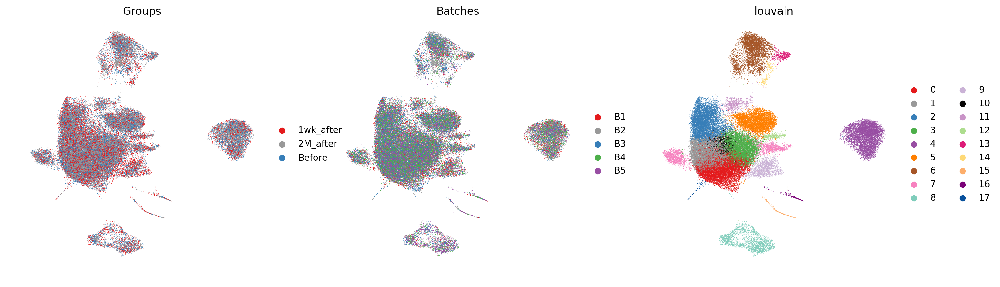

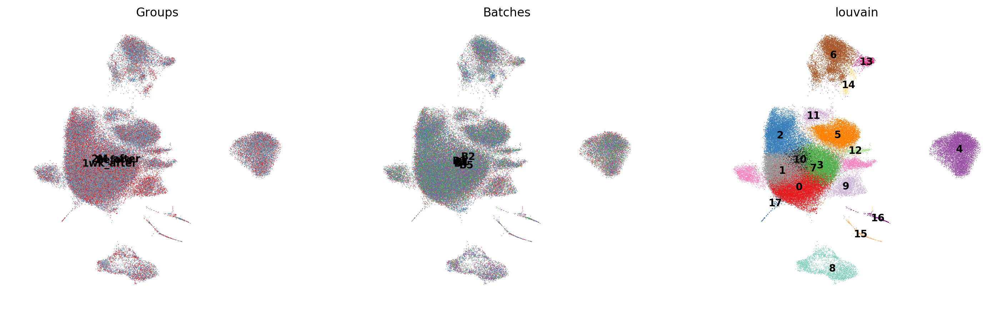

In [45]:
#----------------- AFETR 10X batches  CORRECTION

rcParams['figure.figsize'] = (5,5)

sc.pl.umap(har_corrected, color=['Groups','Batches','louvain'],  frameon=False)
sc.pl.umap(har_corrected, color=['Groups', 'Batches','louvain'],frameon=False,legend_loc='on data',legend_fontsize=10)


In [46]:
har_corrected

AnnData object with n_obs × n_vars = 82153 × 2364 
    obs: 'Age', 'Gender', 'Race', 'Groups', 'Subjects', 'Batches', 'IDs', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Batches_colors', 'Groups_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'dendrogram_louvain'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

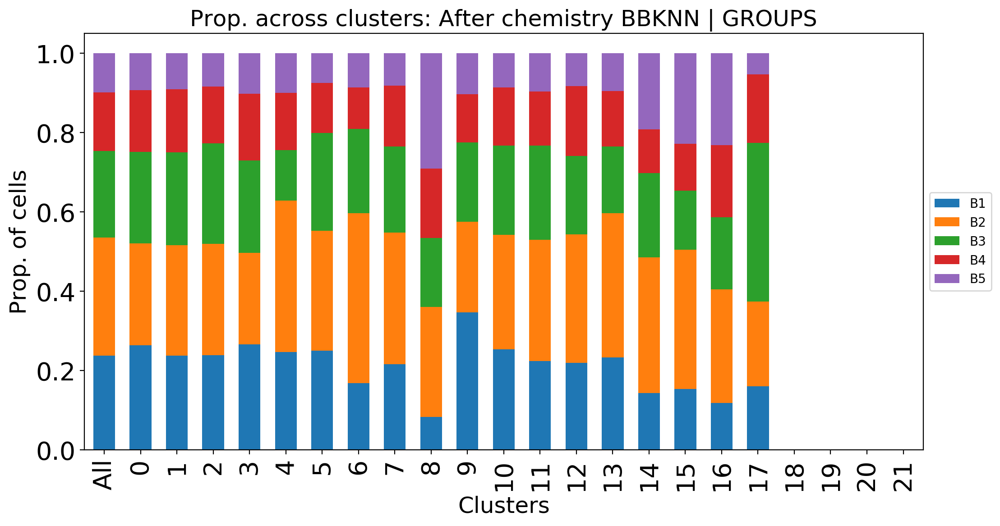

In [47]:
#-- proportion table
Groups_tab = pd.crosstab(index=har_corrected.obs['louvain'],columns=har_corrected.obs['Batches'], margins=True)               # Name the count column

#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21'])
#Groups_tab = Groups_tab[['HI','HC','HY','HO','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.6, 
            fontsize=20)

plt.title("Prop. across clusters: After chemistry BBKNN | GROUPS", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()



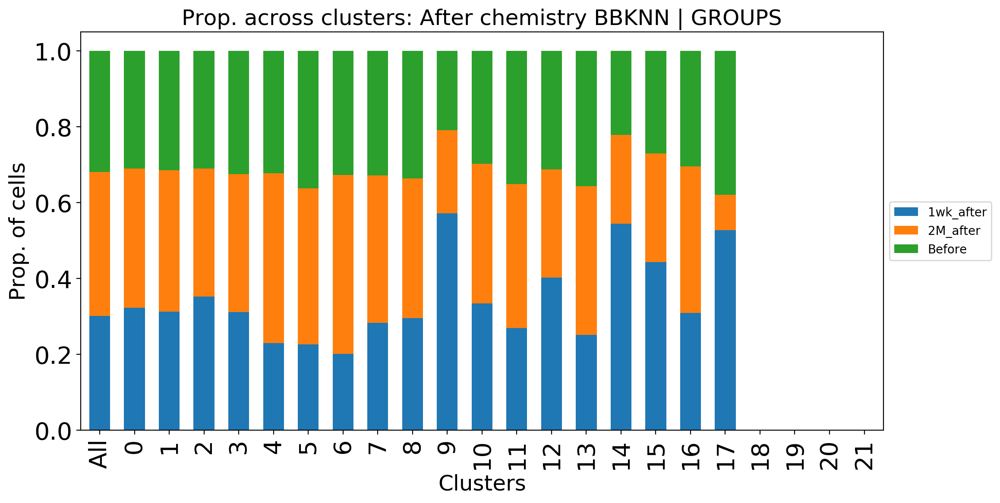

In [48]:
#-- proportion table
Groups_tab = pd.crosstab(index=har_corrected.obs['louvain'],
                         columns=har_corrected.obs['Groups'], margins=True)               # Name the count column

#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21'])
#Groups_tab = Groups_tab[['HI','HC','HY','HO','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.6, 
            fontsize=20)

plt.title("Prop. across clusters: After chemistry BBKNN | GROUPS", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()



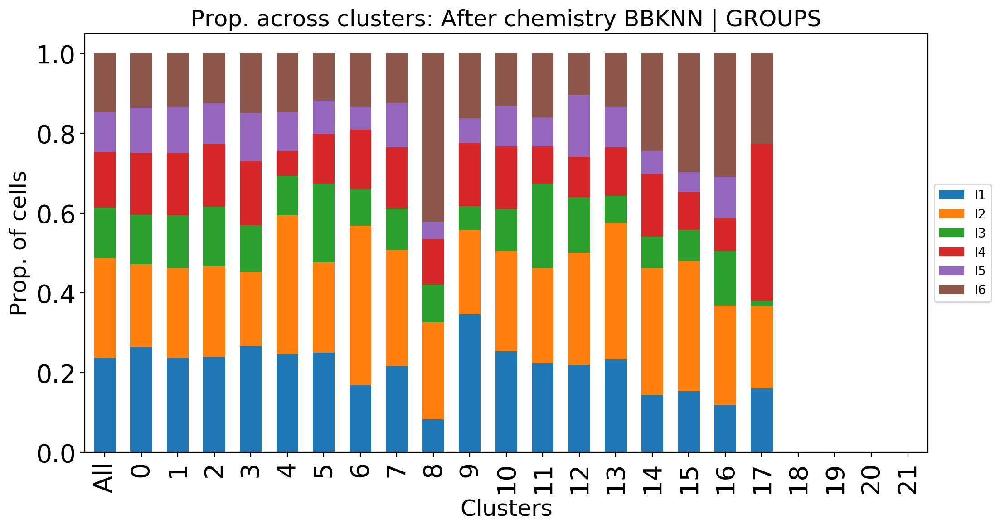

In [49]:
#-- proportion table
Groups_tab = pd.crosstab(index=har_corrected.obs['louvain'],
                         columns=har_corrected.obs['Subjects'], margins=True)               # Name the count column

#-- change index and columns order
Groups_tab = Groups_tab.reindex(['All','0','1','2','3','4','5','6','7','8','9','10','11','12',
                                 '13','14','15','16','17','18','19','20','21'])
#Groups_tab = Groups_tab[['HI','HC','HY','HO','All']]

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(12,6),
            stacked=True, 
            linewidth=1, 
            width=0.6, 
            fontsize=20)

plt.title("Prop. across clusters: After chemistry BBKNN | GROUPS", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()



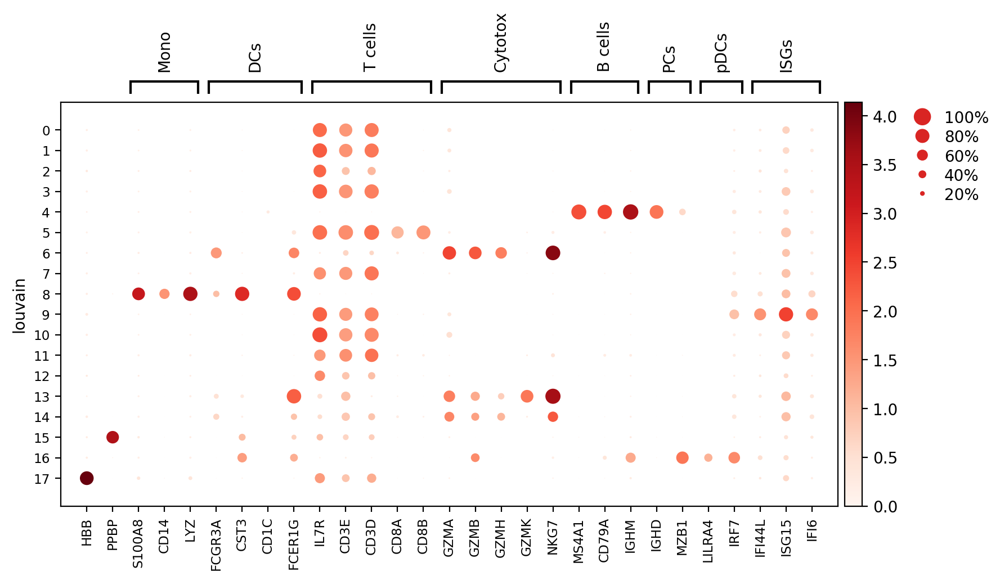

In [54]:
sc.settings.set_figure_params(dpi=300)  # set sufficiently high resolution for saving

Genes =["HBB", "PPBP","S100A8","CD14","LYZ","FCGR3A","CST3",'CD1C',"FCER1G","IL7R","CD3E","CD3D","CD8A","CD8B", 
        "GZMA","GZMB","GZMH","GZMK", "NKG7", "MS4A1", "CD79A",'IGHM',"IGHD","MZB1",'LILRA4',"IRF7",
        'IFI44L','ISG15','IFI6']
matplotlib.style.use('default') 


ax = sc.pl.dotplot(har_corrected, 
                   Genes, 
                   'louvain', 
                   #dendrogram=True,  
                   var_group_positions=[(2,4), (5,8),(9,13),(14,18),(19,21),(22,23),(24,25),(26,28)],
                   var_group_labels=['Mono', 'DCs','T cells','Cytotox','B cells','PCs','pDCs','ISGs'], 
                   figsize=(10,5)) #, save='_Fig1c_LifeSpan') #, save='_Fig1c.pdf'
